In [1]:
import pandas as pd
import numpy as np
import re

import matplotlib.pyplot as plt

import json
from pathlib import Path
import os
import sys

# Appends the entire brainstation_capstone project folder to the path.
# This allows us to make a relative import of our scripts in brainstation_capstone/scripts
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

from utilities import utils
DATA_PATH = utils.get_datapath('data')

# Exploring Views and Splitting Views

We will split the views based on how the distribution of the views look like. 

In [2]:
df = pd.read_csv(DATA_PATH / 'clean_lyrics.csv')

In [3]:
df['views'].describe()

count    3.790500e+04
mean     1.212105e+05
std      3.963521e+05
min      5.001000e+03
25%      1.200700e+04
50%      2.892900e+04
75%      8.451300e+04
max      2.276911e+07
Name: views, dtype: float64

<AxesSubplot:>

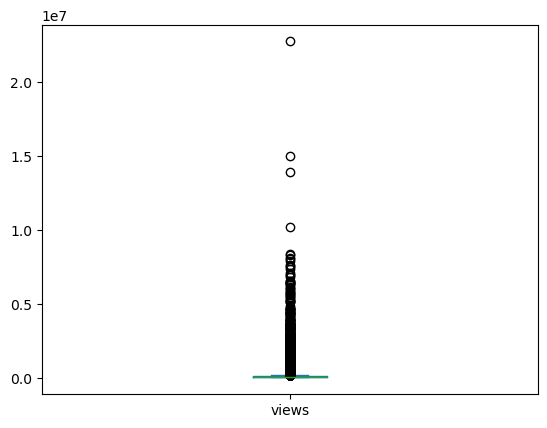

In [4]:
df['views'].plot(kind='box')

In [5]:
df['views'].min()

5001.0

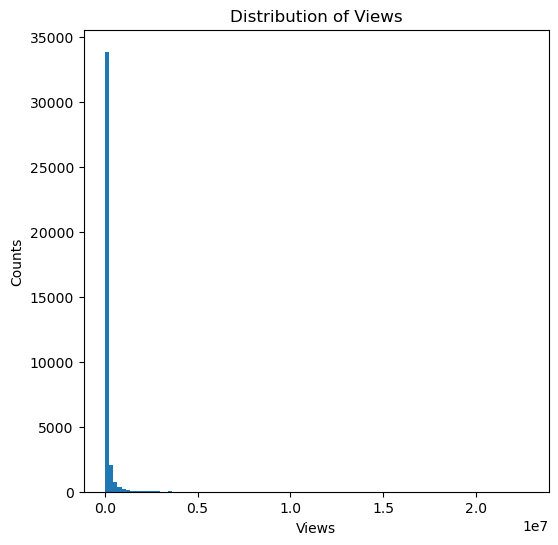

In [10]:
plt.figure(figsize=(6,6))
plt.hist(df['views'], bins=100)
plt.title('Distribution of Views')
plt.xlabel('Views')
plt.ylabel('Counts')
plt.show()

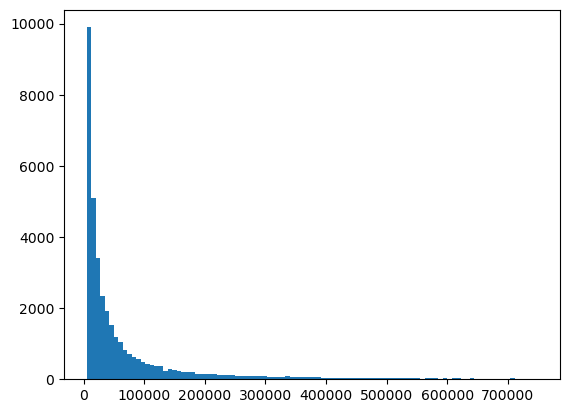

In [5]:
plt.hist(df['views'].loc[df['views'] < 0.75E6], bins=100);

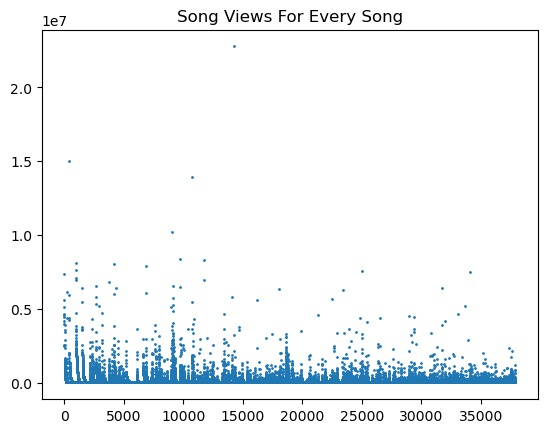

In [6]:
plt.figure()
plt.scatter(x=df.index, y=df['views'], s=1)
plt.title('Song views for every song'.title())
plt.show()

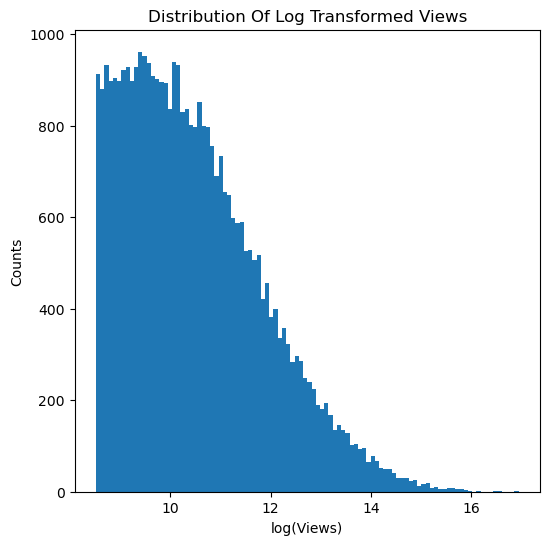

In [11]:
plt.figure(figsize=(6,6))
plt.hist(np.log(df['views']), bins=100)
plt.title('Distribution of Log Transformed Views'.title())
plt.ylabel('Counts')
plt.xlabel('log(Views)')
plt.show()

In [13]:
np.log(df['views']).describe()

count    37905.000000
mean        10.491408
std          1.370574
min          8.517393
25%          9.393245
50%         10.272600
75%         11.344661
max         16.940915
Name: views, dtype: float64

<AxesSubplot:>

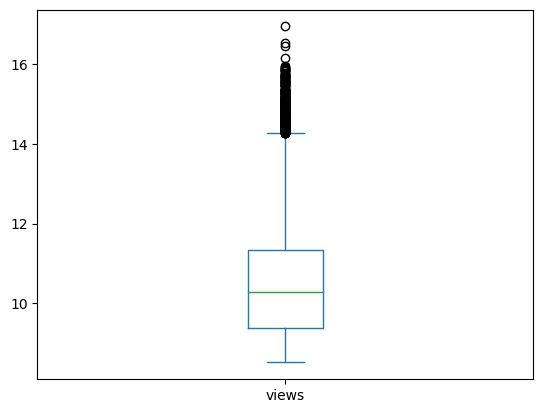

In [15]:
np.log(df['views']).plot(kind='box')

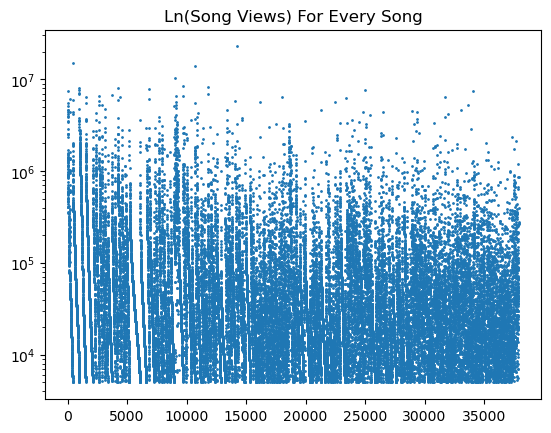

In [29]:
plt.figure()
plt.scatter(x=df.index, y=df['views'], s=1)
plt.title('ln(Song views) for every song'.title())
plt.yscale('log')
plt.show()

# Looking at Decomposition of Vectorized Data

In [3]:
from sklearn.decomposition import NMF
import plotly.express as px

In [9]:
X_train, X_test, y_train, y_test = utils.load_transformed_data('bag_of_words_three_class')
nmf = NMF(n_components=3)

nmf.fit(X_train)
X_train_truncated = nmf.transform(X_train)
temp_df = pd.DataFrame(
    {
        'component_1' : X_train_truncated[:,0],
        'component_2' : X_train_truncated[:,1],
        'component_3' : X_train_truncated[:,2],
        'popularity': [str(i) for i in y_train]
    }
    
)

temp_df.head()

fig = px.scatter_3d(
    temp_df,
    x='component_1',
    y='component_2',
    z='component_3',
    color='popularity',
    title='Non-Negative Matrix Factorization <br>N-grams = 1 <br>3 Class Popularity'
)

fig.update_layout(
    width=600,
    height=600
)

fig.update_traces(marker={'size': 3})

fig.show()


In [12]:
X_train, X_test, y_train, y_test = utils.load_transformed_data('tf_idf_three_class')
nmf = NMF(n_components=3)

nmf.fit(X_train)
X_train_truncated = nmf.transform(X_train)
temp_df = pd.DataFrame(
    {
        'component_1' : X_train_truncated[:,0],
        'component_2' : X_train_truncated[:,1],
        'component_3' : X_train_truncated[:,2],
        'popularity': [str(i) for i in y_train]
    }
    
)

temp_df.head()

fig = px.scatter_3d(
    temp_df,
    x='component_1',
    y='component_2',
    z='component_3',
    color='popularity',
    title='Non-Negative Matrix Factorization <br>TF-IDF <br>3 Class Popularity'
)

fig.update_layout(
    width=600,
    height=600
)

fig.update_traces(marker={'size': 2})

fig.show()

In [13]:
X_train, X_test, y_train, y_test = utils.load_transformed_data('2_grams_three_class')
nmf = NMF(n_components=3)

nmf.fit(X_train)
X_train_truncated = nmf.transform(X_train)
temp_df = pd.DataFrame(
    {
        'component_1' : X_train_truncated[:,0],
        'component_2' : X_train_truncated[:,1],
        'component_3' : X_train_truncated[:,2],
        'popularity': [str(i) for i in y_train]
    }
    
)

temp_df.head()

fig = px.scatter_3d(
    temp_df,
    x='component_1',
    y='component_2',
    z='component_3',
    color='popularity',
    title='Non-Negative Matrix Factorization <br>N-grams = 1 and 2 <br>3 Class Popularity'
)

fig.update_layout(
    width=600,
    height=600
)

fig.update_traces(marker={'size': 2})

fig.show()

In [15]:
X_train, X_test, y_train, y_test = utils.load_transformed_data('3_grams_three_class')
nmf = NMF(n_components=3)

nmf.fit(X_train)
X_train_truncated = nmf.transform(X_train)
temp_df = pd.DataFrame(
    {
        'component_1' : X_train_truncated[:,0],
        'component_2' : X_train_truncated[:,1],
        'component_3' : X_train_truncated[:,2],
        'popularity': [str(i) for i in y_train]
    }
    
)

temp_df.head()

fig = px.scatter_3d(
    temp_df,
    x='component_1',
    y='component_2',
    z='component_3',
    color='popularity',
    title='Non-Negative Matrix Factorization <br>N-grams = 1, 2 and 3 <br>3 Class Popularity'
)

fig.update_layout(
    width=600,
    height=600
)

fig.update_traces(marker={'size': 2})

fig.show()

In [16]:
X_train, X_test, y_train, y_test = utils.load_transformed_data('all_vectorizers_three_class')
nmf = NMF(n_components=3)

nmf.fit(X_train)
X_train_truncated = nmf.transform(X_train)
temp_df = pd.DataFrame(
    {
        'component_1' : X_train_truncated[:,0],
        'component_2' : X_train_truncated[:,1],
        'component_3' : X_train_truncated[:,2],
        'popularity': [str(i) for i in y_train]
    }
    
)

temp_df.head()

fig = px.scatter_3d(
    temp_df,
    x='component_1',
    y='component_2',
    z='component_3',
    color='popularity',
    title='Non-Negative Matrix Factorization <br>All Vectorizers Combined <br>3 Class Popularity'
)

fig.update_layout(
    width=600,
    height=600
)

fig.update_traces(marker={'size': 2})

fig.show()